## Benchmarking `Gillespie.jl`

### Load packages

In [1]:
using DataFrames
using DataArrays
using Distributions
using Gillespie
using BenchmarkTools
using Gadfly
using LSODA
using DifferentialEquations

## A deterministic SIR model

In [2]:
function sirode!(t,x,xdot,data)
    (S,I,R) = x
    (β,γ) = data
    xdot[1] = -β*S*I
    xdot[2] = β*S*I-γ*I
    xdot[3] = γ*I
    nothing
end;

In [3]:
times = [t for t in 0:1.0:400.0]
ctx,res = lsoda(sirode!,[9999.0,1.0,0.0],times,userdata=[0.1/10000,0.05],reltol=1e-4,abstol=Vector([1e-9,1e-9,1e-9]))
simulation_ode = DataFrame(time=times,S=res[:,1],I=res[:,2],R=res[:,3]);

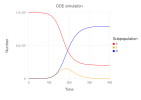

In [4]:
plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
plot(simulation_ode,
    layer(x=:time,y=:S,Geom.line,Theme(default_color=colorant"red")),
    layer(x=:time,y=:I,Geom.line,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:R,Geom.line,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("ODE simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [5]:
simulation_ode[:infection] = 0.1/10000*simulation_ode[:S].*simulation_ode[:I]
simulation_ode[:recovery] = 0.05*simulation_ode[:I]
simulation_ode[:rate] = simulation_ode[:infection]+simulation_ode[:recovery];

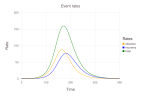

In [6]:
plot(simulation_ode,
    layer(x=:time,y=:infection,Geom.line,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:recovery,Geom.line,Theme(default_color=colorant"blue")),
    layer(x=:time,y=:rate,Geom.line,Theme(default_color=colorant"green")),
    Guide.xlabel("Time"),
    Guide.ylabel("Rate"),
    Guide.title("Event rates"),
    Guide.manual_color_key("Rates",["infection","recovery","total"],["orange","blue","green"]),
    plot_theme
)

In [7]:
maximum(simulation_ode[:rate])

159.5052981842503

### Define hand-coded function for comparison

In [8]:
function sir(β,γ,S0,I0,R0,tf)
    t = 0
    S = S0
    I = I0
    R = R0
    ta=DataArray(Float64,0)
    Sa=DataArray(Float64,0)
    Ia=DataArray(Float64,0)
    Ra=DataArray(Float64,0)
    while t < tf
        push!(ta,t)
        push!(Sa,S)
        push!(Ia,I)
        push!(Ra,R)
        pf1 = β*S*I
        pf2 = γ*I
        pf = pf1+pf2
        dt = rand(Exponential(1/pf))
        t = t+dt
        if t>tf
            break
        end
        ru = rand()
        if ru<(pf1/pf)
            S=S-1
            I=I+1
        else
            I=I-1
            R=R+1
        end
    end
    results = DataFrame()
    results[:time] = ta
    results[:S] = Sa
    results[:I] = Ia
    results[:R] = Ra
    return(results)
end;

In [9]:
srand(1235)
simulation_hc = sir(0.1/10000,0.05,9999,1,0,400);

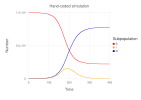

In [10]:
plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
plot(simulation_hc,
    layer(x=:time,y=:S,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:I,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:R,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Hand-coded simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [11]:
srand(1234)
@benchmark sir(0.1/10000,0.05,9999,1,0,400) samples=1000 seconds=100

BenchmarkTools.Trial: 
  memory estimate:  2.41 KiB
  allocs estimate:  46
  --------------
  minimum time:     3.364 μs (0.00% GC)
  median time:      3.043 ms (0.00% GC)
  mean time:        1.759 ms (0.00% GC)
  maximum time:     4.162 ms (0.00% GC)
  --------------
  samples:          1000
  evals/sample:     1
  time tolerance:   5.00%
  memory tolerance: 1.00%

## DiffEq implementation

The implementations below are taken from the test cases in [DiffEqJump.jl](https://github.com/JuliaDiffEq/DiffEqJump.jl) by Chris Rackauckas, which offers a more general purpose approach to solving problems such as differential equations, jump processes etc.. There are two broad ways of defining such a model (described [here](http://docs.juliadiffeq.org/latest/tutorials/discrete_stochastic_example.html)); using a syntax that defines 'reactions' (in a systems biology sense); or by explicitly writing functions for the jumps, which is a bit more flexible.

### Using the `Reaction` syntax

In [12]:
infection = Reaction(0.1/10000,[1,2],[(1,-1),(2,1)])
recovery = Reaction(0.05,[2],[(2,-1),(3,1)]);

In [13]:
sir_prob = DiscreteProblem([9999,1,0],(0.0,400.0));

In [14]:
srand(1234)
sir_jump_prob = GillespieProblem(sir_prob,Direct(),infection,recovery);
sir_sol = solve(sir_jump_prob,DifferentialEquations.Discrete());

In [15]:
function diffeq_data(x::DiffEqBase.ODESolution)
    tu = tuples(x)
    tm = [t for (t,u) in tu]
    states = [u for (t,u) in tu]
    nstates = length(states[1])
    df = DataFrame()
    df[Symbol("time")] = DataArray(tm)
    for i in 1:nstates
        y = [s[i] for s in states]
        df[Symbol("x"*string(i))] = DataArray(y)
    end
    return(df)
end;

In [16]:
sir_data=diffeq_data(sir_sol);

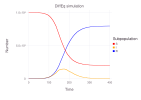

In [17]:
plot(sir_data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("DiffEq simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [18]:
srand(1234)
@benchmark solve(sir_jump_prob,DifferentialEquations.Discrete()) samples=1000 seconds=100

BenchmarkTools.Trial: 
  memory estimate:  13.14 KiB
  allocs estimate:  519
  --------------
  minimum time:     84.943 μs (0.00% GC)
  median time:      143.692 μs (0.00% GC)
  mean time:        5.615 ms (14.05% GC)
  maximum time:     16.244 ms (34.13% GC)
  --------------
  samples:          1000
  evals/sample:     1
  time tolerance:   5.00%
  memory tolerance: 1.00%

### Explicit description of the jumps

In [19]:
using DiffEqJump, DiffEqBase, OrdinaryDiffEq

In [20]:
infection_rate = (t,u) -> (0.1/10000.0)*u[1]*u[2]
infect! = function (integrator)
  integrator.u[1] -= 1
  integrator.u[2] += 1
end
infect_jump = ConstantRateJump(infection_rate,infect!)

recovery_rate = (t,u) -> 0.05*u[2]
recover! = function (integrator)
  integrator.u[2] -= 1
  integrator.u[3] += 1
end
recover_jump = ConstantRateJump(recovery_rate,recover!);

In [21]:
srand(1234)
sir_jump_prob = JumpProblem(sir_prob,Direct(),infect_jump,recover_jump)
sir_jump_sol = solve(sir_jump_prob,OrdinaryDiffEq.Discrete(apply_map=false));

In [22]:
sir_jump_data = diffeq_data(sir_jump_sol);

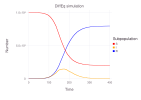

In [23]:
plot(sir_jump_data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("DiffEq simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [24]:
nums = Int[]
@time for i in 1:1000
    sir_prob = DiscreteProblem([9999,1,0],(0.0,400.0))
    sir_jump_prob = JumpProblem(sir_prob,Direct(),infect_jump,recover_jump)
    sir_sol = solve(sir_jump_prob,OrdinaryDiffEq.Discrete(apply_map=false))
    push!(nums,sir_sol[end][3])
end
mean(nums)

  5.004708 seconds (39.27 M allocations: 2.327 GB, 10.90% gc time)


3983.691

## Gillespie.jl SSA implementation

In [25]:
function F(x,parms)
  (S,I,R) = x
  (β,γ) = parms
  infection = β*S*I
  recovery = γ*I
  [infection,recovery]
    end;

Arguments for `ssa`:

- **x0** : a `Vector` of `Int64`, representing the initial states of the system.
- **F** : a callable type (`Base.Callable`) e.g. a function, which itself takes two arguments
  - **x**, a `Vector` of `Int64` representing the states
  - **parms**, a `Vector` of `Float64` representing the parameters of the system (see below).
- **nu** : a `Matrix` of `Int64`, representing the transitions of the system, organised by row.
- **parms** : a `Vector` of `Float64` representing the parameters of the system.
- **tf** : the final simulation time (`Float64`)


In [26]:
x0 = [9999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/10000.0,0.05]
tf = 400.0;

### Benchmarks using standard Gillespie SSA

In [27]:
srand(1235)
simulation_gillespie = ssa(x0,F,nu,parms,tf)
simulation_gillespie_df = ssa_data(simulation_gillespie);

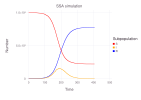

In [28]:
plot(simulation_gillespie_df,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("SSA simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [29]:
srand(1234)
@benchmark ssa($x0,$F,$nu,$parms,$tf) samples=1000 seconds=100

BenchmarkTools.Trial: 
  memory estimate:  1.95 KiB
  allocs estimate:  35
  --------------
  minimum time:     2.270 μs (0.00% GC)
  median time:      1.570 ms (27.99% GC)
  mean time:        1.440 ms (25.74% GC)
  maximum time:     3.105 ms (28.43% GC)
  --------------
  samples:          1000
  evals/sample:     9
  time tolerance:   5.00%
  memory tolerance: 1.00%

### Benchmarks using uniformization/thinning/Jensen's method

In [30]:
mr = maximum(simulation_ode[:rate])*1.5
srand(2)
simulation_jensen=ssa(x0,F,nu,parms,tf,algo=:jensen,max_rate=mr) # compile
simulation_jensen_df=ssa_data(simulation_jensen);

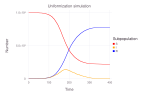

In [31]:
plot(simulation_jensen_df,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Uniformization simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

In [32]:
srand(1234)
@benchmark ssa($x0,$F,$nu,$parms,$tf,algo=:jensen,max_rate=$mr) samples=100 seconds=400

BenchmarkTools.Trial: 
  memory estimate:  78.20 KiB
  allocs estimate:  1908
  --------------
  minimum time:     1.159 ms (0.00% GC)
  median time:      244.686 ms (2.06% GC)
  mean time:        1.248 s (1.48% GC)
  maximum time:     2.865 s (1.59% GC)
  --------------
  samples:          100
  evals/sample:     1
  time tolerance:   5.00%
  memory tolerance: 1.00%

### Comparison between the output

This compares the final size between the different algorithms/implementations.

In [33]:
nruns = 1000
srand(1234)
gr = [ssa(x0,F,nu,parms,tf).data[end,end] for i in 1:nruns]
srand(1234)
hr = [sir(0.1/10000,0.05,9999,1,0,400)[end,end] for i in 1:nruns];

In [34]:
nruns_jensen = 100
srand(1234)
js = [ssa(x0,F,nu,parms,tf,algo=:jensen,max_rate=mr) for i in 1:nruns_jensen]
jr = [x.data[end,end] for x in js if x.stats.termination_status!="upper_bound_exceeded"]
if length(jr)<length(js)
  print("Upper bound exceeded")
end

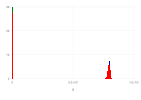

In [35]:
plot(
    layer(x=gr,Geom.histogram(density=true),Theme(default_color=colorant"red")),
    layer(x=jr,Geom.histogram(density=true),Theme(default_color=colorant"blue")),
    layer(x=hr,Geom.histogram(density=true),Theme(default_color=colorant"green")),
    plot_theme
)